pystac-client 0.4 used due to depreciation issues

In [54]:
# pip install  pystac-client==0.4

In [55]:
# pip show pystac_client

In [56]:
# imports
import pystac_client
import xarray as xr
import matplotlib.pyplot as plt
import pathlib
import os
import numpy as np
import geopandas as gpd
import matplotlib as mpl
from matplotlib import colors
import rasterio

import cartopy.crs as ccrs
import cartopy
import plotly.graph_objects as go
import plotly.express as px
from rasterio.plot import show

from tqdm import tqdm


In [57]:
# opening STAC catalog

catalog = pystac_client.Client.open(
    "https://storage.googleapis.com/dgds-data-public/gca/SOTC/gca-stac_sotc/catalog.json" # cloud API
    # r"p:\1000545-054-globalbeaches\15_GlobalCoastalAtlas\coclicodata\current\catalog.json" # P drive API 
)
catalog


<Client id=gca-catalog>

In [58]:
list(catalog.get_collections())

[<CollectionClient id=shore_mon_fut>,
 <CollectionClient id=sed_class>,
 <CollectionClient id=shore_mon>,
 <CollectionClient id=world_pop>,
 <CollectionClient id=world_gdp>,
 <CollectionClient id=shore_mon_hr>,
 <CollectionClient id=shore_mon_drivers>,
 <CollectionClient id=esl_gwl>,
 <CollectionClient id=sub_threat>,
 <CollectionClient id=Exp_world_pop>,
 <CollectionClient id=Haz-ESL>,
 <CollectionClient id=Vul-Inf_Mort>,
 <CollectionClient id=Haz-GCM_90-100>,
 <CollectionClient id=Exp-NS_Slopes>,
 <CollectionClient id=Vul_MYS>,
 <CollectionClient id=Vul_RS>,
 <CollectionClient id=Haz-GCM_40-50>,
 <CollectionClient id=Haz-ERA5_04-14>,
 <CollectionClient id=Vul-GDP_Cap>,
 <CollectionClient id=Haz-GCM_04-14>,
 <CollectionClient id=Haz-Land_Sub_2010_COGs>,
 <CollectionClient id=Haz-Land_Sub_2040_COGs>,
 <CollectionClient id=Vul-Roads_Density_COGs>]

In [59]:
collection= catalog.get_child("Haz-Land_Sub_2010_COGs")
collection

<CollectionClient id=Haz-Land_Sub_2010_COGs>

In [60]:
# items=list(collection.get_all_items())
# print(f"Number of items: {len(items)}")


In [61]:

# for item in items:
#     print(f"- {item.id}")

Test getting x-102.0_y-1

In [62]:
lon=-77.56
lat=+18.28
# B01_x12.0_y-70.0
item_name="B01_x-51.0_y50.0"
item=collection.get_item(item_name)
item

<Item id=B01_x-51.0_y50.0>

In [63]:
href=item.assets["band_data"].href
href

'https://storage.googleapis.com/dgds-data-public/gca/SOTC/Haz-Land_Sub_2010_COGs/B01_x-51.0_y50.0.tif'

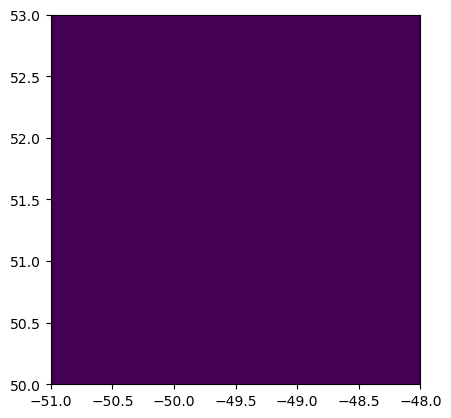

<Axes: >

In [64]:


img=rasterio.open(href)
# Plot the entire raster as an RGB image
show(img)

In [65]:
Land_sub = xr.open_dataset(
    href, engine="rasterio", mask_and_scale=False
)
Land_sub

<xarray.Dataset>
Dimensions:      (band: 1, x: 360, y: 360)
Coordinates:
  * band         (band) int32 1
  * x            (x) float64 -51.0 -50.99 -50.98 -50.97 ... -48.02 -48.01 -48.0
  * y            (y) float64 53.0 52.99 52.98 52.97 ... 50.03 50.02 50.01 50.0
    spatial_ref  int32 ...
Data variables:
    band_data    (band, y, x) uint8 ...

In [66]:
def find_tile_name(latitude, longitude,sample_bottom_left_lon, sample_bottom_left_lat,tile_size):
    # Define the tile size in degrees (3 degrees in both latitude and longitude)
    offset_lon=sample_bottom_left_lon % tile_size
    offset_lat=sample_bottom_left_lat % tile_size

    
    # longitude=np.sign(longitude)*(abs(longitude)-abs(offset_lon))
    # latitude=np.sign(latitude)*(abs(latitude)-abs(offset_lat))
    
    # Calculate the bottom left corner coordinates of the tile positives only
    bottom_left_lon = (longitude // tile_size) * tile_size
    bottom_left_lat = (latitude // tile_size) * tile_size


    # If offset == 0 then perfect
    if offset_lat == 0:
         bottom_left_lat_final=bottom_left_lat
    if offset_lon == 0:
         bottom_left_lon_final=bottom_left_lon

    if offset_lat != 0 :
         bottom_left_lat_final=bottom_left_lat + offset_lat
         if bottom_left_lat_final > latitude:
              bottom_left_lat_final=bottom_left_lat_final-tile_size
    if offset_lon != 0 :
         bottom_left_lon_final=bottom_left_lon + offset_lon
         if bottom_left_lon_final > longitude:
              bottom_left_lon_final=bottom_left_lon_final-tile_size







    # Generate the tile name using the bottom left corner's coordinates
    tile_name = f"B01_x{bottom_left_lon_final:.1f}_y{bottom_left_lat_final:.1f}"

    return tile_name


In [67]:
# (-44.7//3)*3

In [77]:
import numpy as np
lon_x=178.4
lat_y=63.4

lon_x=-124.1
lat_y=78.17

lon_x=-70.5
lat_y=-14.4

lon_x=7.74
lat_y=-44.7

Sample_left_lon_x=-78
Sample_bottom_lat_y=14
tile_size=3

tile_name = find_tile_name(lat_y, lon_x,Sample_left_lon_x,Sample_bottom_lat_y,tile_size)
print(f"The point belongs to the tile: {tile_name}")

The point belongs to the tile: B01_x6.0_y-46.0


In [78]:

lon_x=-77.4253
lat_y= 17.8684

tile_name = find_tile_name(lat_y, lon_x,Sample_left_lon_x,Sample_bottom_lat_y,tile_size)
tile_name


'B01_x-78.0_y14.0'

In [80]:
(17//3)*3

15

In [74]:

href=collection.get_item(tile_name).assets["band_data"].href

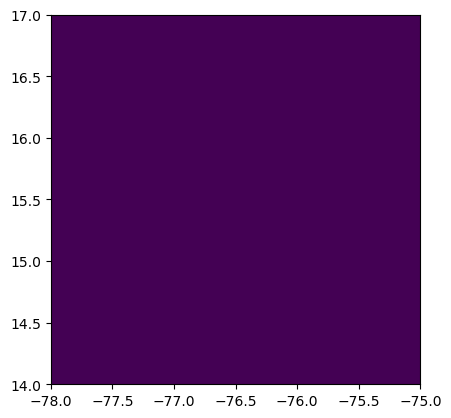

<Axes: >

In [75]:
Land_sub_img=rasterio.open(href)
# Plot the entire raster as an RGB image
show(Land_sub_img)


In [72]:

Land_sub_xr = xr.open_dataset(
    href, engine="rasterio", mask_and_scale=False
)
Land_sub_xr

<xarray.Dataset>
Dimensions:      (band: 1, x: 360, y: 360)
Coordinates:
  * band         (band) int32 1
  * x            (x) float64 -78.0 -77.99 -77.98 -77.97 ... -75.02 -75.01 -75.0
  * y            (y) float64 17.0 16.99 16.98 16.97 ... 14.03 14.02 14.01 14.0
    spatial_ref  int32 ...
Data variables:
    band_data    (band, y, x) uint8 ...